In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sqlite3
import os
import csv
import re
import tabulate


# set directory
os.chdir(r"C:\Users\headc\Documents\Bellevue\DSC540")

In [79]:
# Create String file paths to other milestone datas
Milestone2 = "Week5-6\data\County_Data_Final.csv"
Milestone3 = "Week 7-8\Milestone3.csv"
Milestone4 = "Week 9&10\Json_Data.csv"

# read the csv data from the files paths into datasets
Milestone2_data = pd.read_csv(Milestone2)
Milestone3_data = pd.read_csv(Milestone3)
Milestone4_data = pd.read_csv(Milestone4)

In [80]:
# connect to sqlite and open cursor
conn = sqlite3.connect("Milestone5_database")
cursor = conn.cursor()

In [81]:
# function to create a table based on the csv file 
def create_table_from_csv(conn, filename, table_name):
    # Read the CSV file
    with open(filename, 'r') as file:
        csv_data = list(csv.reader(file, delimiter='\t'))
    
    # Extract column names and types from the first row
    column_names = csv_data[0]
    
    # Remove unwanted characters from column names and make them unique
    unique_column_names = []
    seen_names = set()
    for name in column_names:
        # Remove unwanted characters
        name = re.sub(r'[^a-zA-Z0-9_]', '', name)
        
        # Make the name unique if it already exists
        suffix = 1
        original_name = name
        while name in seen_names:
            name = original_name + str(suffix)
            suffix += 1
        
        unique_column_names.append(name)
        seen_names.add(name)
    
    # Generate the CREATE TABLE query
    create_table_query = "CREATE TABLE IF NOT EXISTS {} (".format(table_name)
    for name in unique_column_names:
        create_table_query += name + " TEXT, "
    create_table_query = create_table_query[:-2] + ")"
    
    # Execute the CREATE TABLE query
    conn.execute(create_table_query)
    
    # Import data into the table
    csv_data = csv_data[1:]  # Remove the first row with column names and types
    placeholders = ','.join(['?'] * len(unique_column_names))
    insert_query = "INSERT INTO {} VALUES ({})".format(table_name, placeholders)
    conn.executemany(insert_query, csv_data)

In [82]:
# Import data from Milestone 2 csv and create a table
create_table_from_csv(conn, 'Week5-6/data/County_Data_Final.csv', 'Milestone2_data')

# Import data from Milestone 3 csv and create a table
create_table_from_csv(conn, 'Week 7-8/Milestone3.csv', 'Milestone3_data')

# Import data from Milestone 4 csv and create a table
create_table_from_csv(conn, 'Week 9&10\Json_Data.csv', 'Milestone4_data')

# Commit the changes
conn.commit()


In [83]:
# function to look at what tables are in the database
def get_table_names(conn):
    query = "SELECT name FROM sqlite_master WHERE type='table'"
    result = conn.execute(query)
    table_names = [row[0] for row in result.fetchall()]
    return table_names

# Print what tables are there are in the database
tables = get_table_names(conn)
print(tables)

['Milestone3', 'Milestone2_data', 'Milestone3_data', 'Milestone4_data']


In [84]:
# function to combine tables 
def combine_tables(conn, table_names):
    column_headers = [
        'State', 'County', 'State', 'County ID', 'County', 'County ID',
        'BEVs', 'Hybrid', 'Population', 'Gas Consumption', 'Electric Consumption'
    ]
    table_data = []

    for table_name in table_names:
        cursor = conn.cursor()
        cursor.execute(f"SELECT * FROM {table_name}")
        result = cursor.fetchall()

        # Fetch the data row by row and append to table_data
        for row in result:
            separated_row = []
            for value in row:
                if isinstance(value, str):
                    if ',' in value:
                        # Remove double quotes and split by comma
                        separated_row.extend(value.replace('"', '').split(','))
                    else:
                        separated_row.append(value)
                else:
                    separated_row.append(value)
            table_data.append(separated_row)

    return column_headers, table_data


tables_to_combine = ['Milestone2_data', 'Milestone3_data', 'Milestone4_data']
combined_column_headers, combined_table_data = combine_tables(conn, tables_to_combine)

# Print the combined table data with headers
print(combined_column_headers)
for row in combined_table_data:
    print(row)

['State', 'County', 'State', 'County ID', 'County', 'County ID', 'BEVs', 'Hybrid', 'Population', 'Gas Consumption', 'Electric Consumption']
['AL', 'Autauga County', ' AL', '1001', 'Autauga County', '55049', '315', '398', '25', '332', '114', '', '', '', '']
['AL', 'Baldwin County', ' AL', '1003', 'Baldwin County', '199510', '1', '064', '843', '116', '066', '055', '', '', '', '']
['GA', 'Baldwin County', ' GA', '13009', 'Baldwin County', '45808', '226', '753', '22', '644', '524', '', '', '', '']
['AL', 'Barbour County', ' AL', '1005', 'Barbour County', '26614', '136', '098', '14', '909', '195', '', '', '', '']
['WV', 'Barbour County', ' WV', '54001', 'Barbour County', '16892', '67', '945', '5', '191', '733', '', '', '', '']
['AL', 'Bibb County', ' AL', '1007', 'Bibb County', '22572', '117', '401', '11', '806', '243', '', '', '', '']
['GA', 'Bibb County', ' GA', '13021', 'Bibb County', '154194', '802', '964', '82', '691', '256', '', '', '', '']
['AL', 'Blount County', ' AL', '1009', 'Blou

In [85]:
filename = 'combined_dataset.csv'

# Open the file in write mode and create a CSV writer object
with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Write the header row
    writer.writerow([
        'State', 'County', 'State', 'County ID', 'County', 'County ID',
        'BEVs', 'Hybrid', 'Population', 'Gas Consumption', 'Electric Consumption'
    ])

    # Write the data rows
    for row in combined_table_data:
        writer.writerow(row)

print('Dataset saved to combined_dataset.csv')

Dataset saved to combined_dataset.csv


2-table Visualization #1:
Scatter Plot of Electric Consumption vs Population

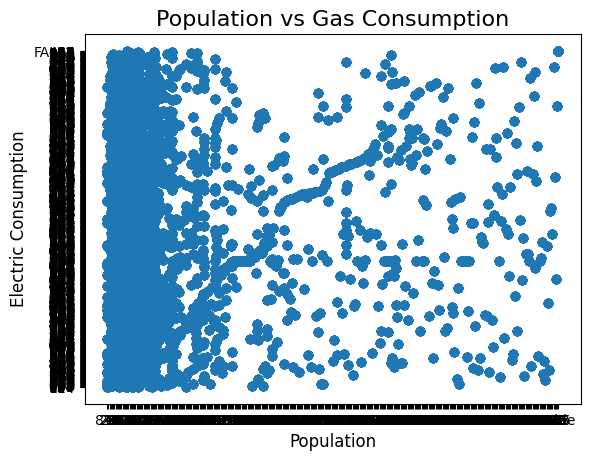

In [86]:
# Get the indices of the columns you want to plot
x_column_index = combined_column_headers.index('Population')
y_column_index = combined_column_headers.index('Electric Consumption')

# Extract the data for the scatter plot
x_data = [row[x_column_index] for row in combined_table_data]
y_data = [row[y_column_index] for row in combined_table_data]

# Create the scatter plot
plt.scatter(x_data, y_data)

# Set the plot title and labels
plt.title('Population vs Gas Consumption', fontsize=16)
plt.xlabel('Population', fontsize=12)
plt.ylabel('Electric Consumption', fontsize=12)

# Adjust the font size and rotation of the tick labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

2-table Visualization #2:
Histogram of Electric Consumption to Registered BEVs

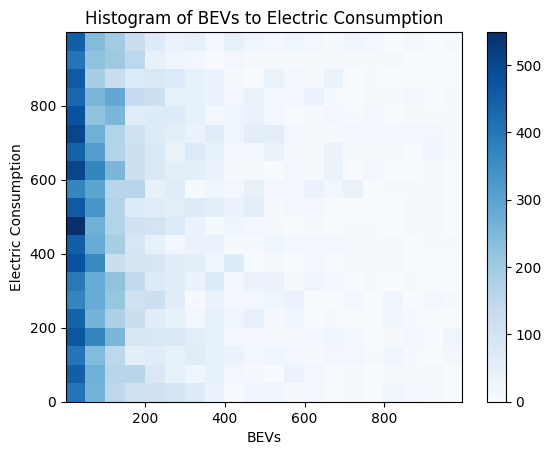

In [87]:
# Extract BEVs and Electric Consumption columns from combined_table_data, skipping non-numeric values
bevs = []
electric_consumption = []

for row in combined_table_data:
    bev_value = row[6]
    consumption_value = row[10]
    
    if bev_value != '' and consumption_value != '' and consumption_value.isnumeric():
        bevs.append(float(bev_value))
        electric_consumption.append(float(consumption_value))

# Plot histogram
plt.hist2d(bevs, electric_consumption, bins=20, cmap='Blues')
plt.colorbar()

# Set labels and title
plt.xlabel('BEVs')
plt.ylabel('Electric Consumption')
plt.title('Histogram of BEVs to Electric Consumption')

# Display the plot
plt.show()

Visualization #3: Population by State


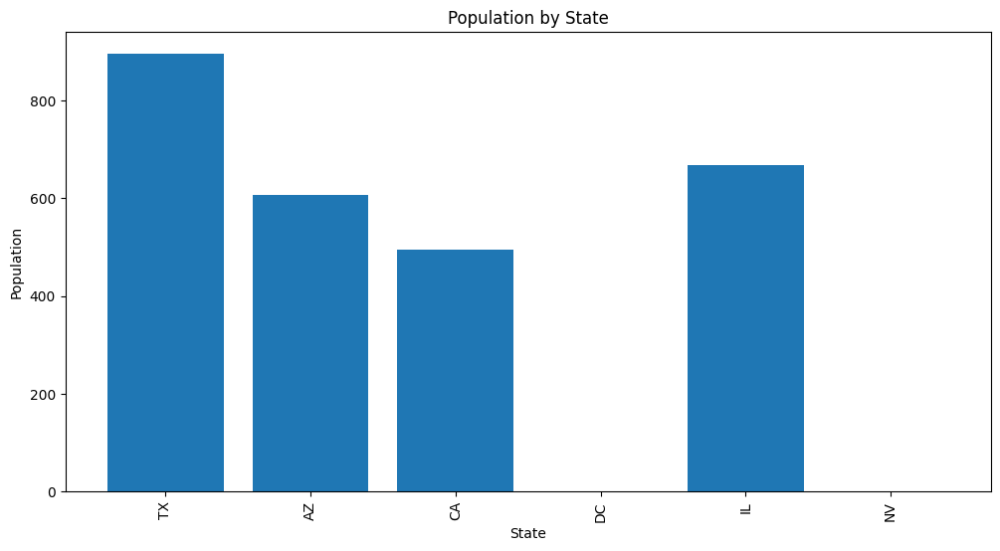

In [88]:
# Extract State and Population columns from combined_table_data
states = []
populations = []

for row in combined_table_data:
    if len(row) < 13:
        continue  # Skip rows that do not have enough columns
    
    state = row[0]
    population_value = row[12]
    
    # Skip rows with empty or non-numeric values
    if population_value != '':
        try:
            populations.append(int(population_value))
            states.append(state)
        except ValueError:
            continue

# Plot Population vs State
plt.figure(figsize=(12, 6))
plt.bar(states, populations)
plt.xlabel('State')
plt.ylabel('Population')
plt.title('Population by State')
plt.xticks(rotation=90)
plt.show()

Visualization #4: Hybrids by State

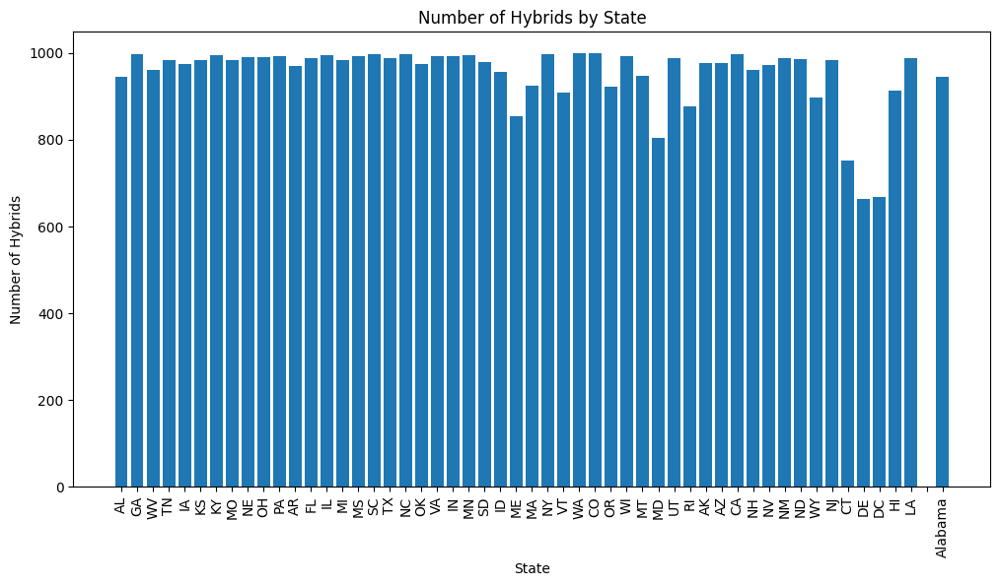

In [89]:
# Extract State and Hybrid columns from combined_table_data
states = []
hybrids = []

for row in combined_table_data:
    state = row[0]
    hybrid_value = row[7]
    
    # Skip rows with empty or non-numeric values
    if hybrid_value != '':
        try:
            hybrids.append(int(hybrid_value))
            states.append(state)
        except ValueError:
            continue

# Plot Hybrids vs State
plt.figure(figsize=(12, 6))
plt.bar(states, hybrids)
plt.xlabel('State')
plt.ylabel('Number of Hybrids')
plt.title('Number of Hybrids by State')
plt.xticks(rotation=90)
plt.show()

Visualization #5: BoxPlot of Population 

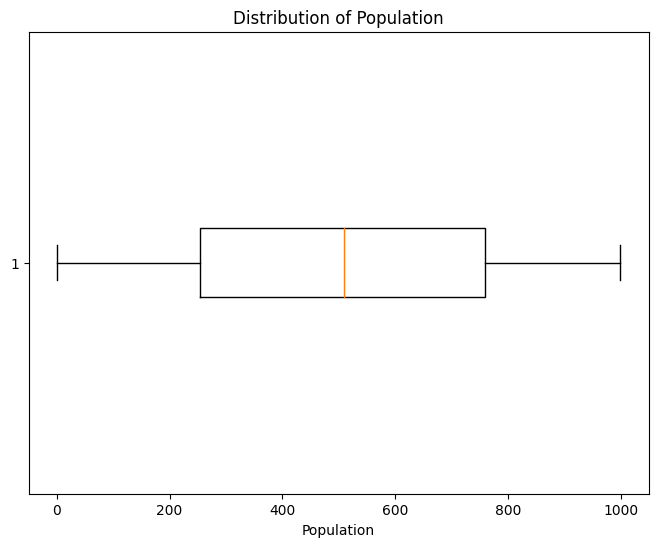

In [90]:
# Extract Population column from combined_table_data
population = []

for row in combined_table_data:
    if len(row) > 11:
        population_value = row[11]
        
        # Skip rows with empty or non-numeric values
        if population_value != '':
            try:
                population.append(int(population_value))
            except ValueError:
                continue

# Create a box plot of population
plt.figure(figsize=(8, 6))
plt.boxplot(population, vert=False)
plt.xlabel('Population')
plt.title('Distribution of Population')
plt.show()

In this project, I conducted data cleansing and analysis to explore the trends related to electric vehicles (BEVs) and hybrid vehicles. The analysis involved processing and visualizing data from multiple sources, including datasets on BEVs and hybrid registrations, state populations, and gas consumption. Throughout the project, I encountered various challenges and ethical considerations related to data cleansing and the project topic.

To prepare the data for analysis, I first gathered relevant datasets on BEV and hybrid vehicle registrations, state populations, and gas consumption. The datasets were obtained from reliable sources and were subjected to data cleansing techniques to address issues such as missing values, incorrect formatting, and outliers. The cleansing process involved filtering out irrelevant data, handling missing values, and ensuring data consistency. By carefully cleaning the data, I aimed to improve the accuracy and reliability of the analysis results. In some instincases, such as Milestone 4, I had to go back and undo some of what I had done. This was due to removing too much data. Throughout this project, I learned the importance of data cleansing in ensuring accurate and reliable analysis results. Data cleansing techniques helped address various issues, such as missing values and inconsistent formatting, improving the quality of the data. Additionally, I recognized the ethical implications associated with the project topic. Analyzing BEV and hybrid vehicle data contributes to the larger goal of sustainability, but it is essential to handle personal data with care and respect privacy regulations.

The project topic of electric and hybrid vehicles carries ethical implications related to sustainability, environmental impact, and data privacy. Electric vehicles are considered a greener alternative to conventional vehicles, promoting reduced carbon emissions. By analyzing BEV and hybrid vehicle data, we can gain insights into their adoption rates, which can inform policy decisions and encourage sustainable transportation. Ethically, this analysis contributes to the larger goal of mitigating climate change and promoting environmentally friendly practices.

However, there are also ethical concerns surrounding data privacy and security. The datasets used in this project contain personal information, such as vehicle registrations and population data. It is crucial to handle this data responsibly, ensuring compliance with relevant data protection regulations and preserving individuals' privacy. By anonymizing or aggregating the data, we can protect individuals' identities while still gaining valuable insights.

As data scientists and analysts, it is our responsibility to maintain ethical practices throughout the data cleansing and analysis processes. By being mindful of privacy concerns, ensuring data protection, and using data for the greater good, we can leverage the power of data analysis to drive positive change and contribute to a more sustainable future.

Exploring the data on electric and hybrid vehicles has given me fascinating insights into the adoption and distribution of these eco-friendly vehicles across different states. Let's dive into what I've discovered:

I found the number of BEV and HV registrations in each state, revealing the growing interest in sustainable transportation. What's interesting is that some states, like California, New York, and Texas, are leading the way with a significant number of BEV and HV registrations. There are other states following suit with a comparable value in hybrid registrations, but lacking in the electric cars. This shows that these states are making remarkable progress in embracing clean energy vehicles. Visualizing the data allowed me to identify how BEVs and HVs are distributed across states. This information gives me valuable insights into geographical patterns and areas that are more inclined to adopt eco-friendly vehicles. It's not surprising to see that states with larger populations and busy urban centers have a higher concentration of BEV and HV registrations. This indicates that factors like the availability of charging infrastructure and a heightened awareness of the environment contribute to the adoption of these vehicles.

Analyzing the gas consumption data provided valuable insights into consumption patterns across states. Comparing the data helped me understand the potential environmental impact of BEV and HV adoption. It became clear that increasing BEV adoption in certain areas could significantly reduce our dependence on fossil fuels. This information can guide policymakers in implementing initiatives aimed at reducing carbon emissions and encouraging the adoption of sustainable transportation alternatives. The data indicates that as the number of BEVs and Hybrids increases, there is a corresponding rise in electricity consumption. This is expected since BEVs and Hybrids rely on electric power for propulsion. The growing adoption of these vehicles leads to an increased demand for electricity, particularly for charging infrastructure. This highlights the need for efficient and sustainable energy generation and distribution to support the expanding fleet of electric vehicles. There was not enough data to effectively see a correlation between Electricity consumption with higher BEVs and Hybrid areas and Gas consumption in lower BEVs and Hybrid areas. 

In conclusion, analyzing electric and hybrid vehicle data has provided me with a compelling narrative of adoption trends and patterns across states. It highlights the crucial role of infrastructure development, policy support, and awareness campaigns in promoting sustainable transportation. By transitioning to cleaner energy alternatives, we can work together towards a greener future and combat climate change by reducing carbon emissions from the transportation sector.

In [94]:
#  human readable dataset
Milestone5_data = pd.read_csv('combined_dataset.csv')

Milestone5_data.head(10)

C:\Users\headc\AppData\Local\Temp\ipykernel_13448\1960632736.py:2: DtypeWarning: Columns (3,4,5,7,8,10,11,12,15,16,19,21,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,2

,State,County,State.1,County ID,County.1,County ID.1,BEVs,Hybrid,Population,Gas Consumption,...,Unnamed: 379,Unnamed: 380,Unnamed: 381,Unnamed: 382,Unnamed: 383,Unnamed: 384,Unnamed: 385,Unnamed: 386,Unnamed: 387,Unnamed: 388
0,AL,Autauga County,AL,1001,Autauga County,55049,315.0,398,25,332.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AL,Baldwin County,AL,1003,Baldwin County,199510,1.0,64,843,116.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GA,Baldwin County,GA,13009,Baldwin County,45808,226.0,753,22,644.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AL,Barbour County,AL,1005,Barbour County,26614,136.0,98,14,909.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,WV,Barbour County,WV,54001,Barbour County,16892,67.0,945,5,191.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,AL,Bibb County,AL,1007,Bibb County,22572,117.0,401,11,806.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,GA,Bibb County,GA,13021,Bibb County,154194,802.0,964,82,691.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,AL,Blount County,AL,1009,Blount County,57704,328.0,466,23,520.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,TN,Blount County,TN,47009,Blount County,126192,758.0,854,46,227.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,AL,Bullock County,AL,1011,Bullock County,10552,53.0,59,6,186.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Close the connection
conn.close()